# **Credit Card Fraud Detection Project**

by _Shruti Agarwal, Zihao Zhou, Zora Mardjoko_

# Part 1: Introduction

Financial losses due to fraud is an ongoing problem, and detecting it is of the utmost importance. Beyond the direct financial losses, credit card fraud damages consumer trust and incurs additional costs in terms of card replacement and fraud investigation. Businesses may face higher fees from payment processors and lose customer loyalty. Banks lose millions of dollars in reimbursements. In 2023 alone, **$246M** was lost due to credit card fraud. With the onset of COVID, we have only experienced an increase in fraudulent transactions, and therefore aim to develop a model that can help banks/businesses classify transactions. We also aim to understand which features play an important role in this classification.


In this project, we intend to analyze a dataset containing information about credit card transactions, and develop a predictive model to determine whether a transaction is fraudulent or not. A predictive fraud detection model can preemptively identify potentially fraudulent transactions and block them before they are completed, reducing losses by preventing suspicious card activity from happening.

# Part 2: Data Loading, Preprocessing, and Feature Engineering

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point

import pandas as pd
import pandasql as ps
import matplotlib.pyplot as plt
import re

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, LabelEncoder

In [2]:
# ONLY USE IN COLAB
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
# Create the kaggle directory and
!mkdir -p ~/.kaggle

In [4]:
# Read the uploaded kaggle.json file
# !cp /Users/zhouzih/Documents/Programming/CIS5450/kaggle.json ~/.kaggle/
# !cp /content/drive/MyDrive/kaggle.json ~/.kaggle/

In [5]:
# Download dataset
!kaggle datasets download -d kelvinkelue/credit-card-fraud-prediction

Dataset URL: https://www.kaggle.com/datasets/kelvinkelue/credit-card-fraud-prediction
License(s): other
credit-card-fraud-prediction.zip: Skipping, found more recently modified local copy (use --force to force download)


In [6]:
# Unzip folder in Colab content folder
!unzip credit-card-fraud-prediction.zip

In [7]:
# TODO: Read the csv file and save it to a dataframe called "cvd_df"
fraud_df = pd.read_csv('fraud test.csv')

# Check out the first five rows
pd.set_option('display.max_columns', None)
fraud_df.head(5)

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,21/06/2020 12:14,2.291160e+15,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,19/03/1968,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,21/06/2020 12:14,3.573030e+15,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",17/01/1990,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,21/06/2020 12:14,3.598220e+15,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",21/10/1970,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,21/06/2020 12:15,3.591920e+15,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,25/07/1987,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,21/06/2020 12:15,3.526830e+15,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,06/07/1955,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [8]:
fraud_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 23 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Unnamed: 0             555719 non-null  int64  
 1   trans_date_trans_time  555719 non-null  object 
 2   cc_num                 555719 non-null  float64
 3   merchant               555719 non-null  object 
 4   category               555719 non-null  object 
 5   amt                    555719 non-null  float64
 6   first                  555719 non-null  object 
 7   last                   555719 non-null  object 
 8   gender                 555719 non-null  object 
 9   street                 555719 non-null  object 
 10  city                   555719 non-null  object 
 11  state                  555719 non-null  object 
 12  zip                    555719 non-null  int64  
 13  lat                    555719 non-null  float64
 14  long                   555719 non-nu

We start by checking the columns that are available in the dataset, and their associated data types.  Our dataset contains various features, such as transaction amount, category, and information about the client and merchant of the transaction. It contains a feature `is_fraud` that denotes whether a transaction is fraudulent or not. The dataset has around 500k rows, with ~2100 of them representing fraudulent transactions.

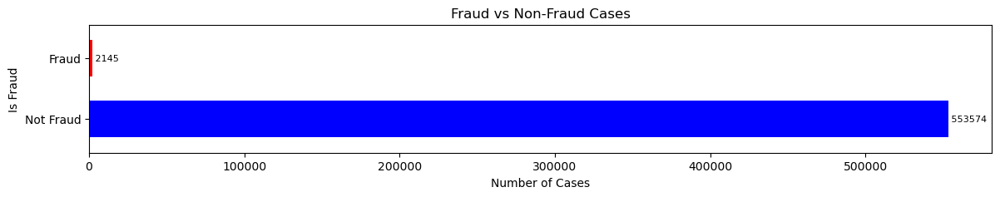

In [9]:
fraud_counts = fraud_df['is_fraud'].value_counts()

plt.figure(figsize=(14, 2)) 

fraud_counts.plot(kind='barh', color=['blue', 'red'], width=0.6)
plt.title('Fraud vs Non-Fraud Cases')
plt.ylabel('Is Fraud')
plt.xlabel('Number of Cases')
plt.yticks(ticks=[0, 1], labels=['Not Fraud', 'Fraud'])
for index, value in enumerate(fraud_counts):
    plt.text(value, index, f' {value}', va='center', color='black', fontsize=8)

plt.show()


For pre-processing the dataset, we start by removing irrelevant columns to streamline the dataset for analysis. Next, we convert Unix time stamps into more intuitive time formats, such as month, day of the week, and time of day, to better analyze transaction patterns. We used the Haversine formula to calculate geographical distances between transaction locations, given the latitude and longitude of the client and merchant, which might help in identifying suspicious activities. We derived the age from the date of birth for demographic analysis. Additionally, state information is categorized into broader divisions.

## 2.1 Dropping Irrelevant Columns/Rows

Let's go through each of columns, and identify some data that will not provide and useful insights to our analysis.


*   The 1st column, titled "Unnamed: 0" appears to be the index of each transaction built in to the data, since we will be manipulating the data and moving them around, the origional ordering does not really matter here
*   The transaction_date_time column could also be removed, as we already have a column later on called "unix_time" which would be much easier to parse
*   The street address of the cardholder is not that relevant, as we already have the exact coordinate needed and we do not expect any street specific identifying information
*   The trans_num (presumably transaction number) is also not that relevant here. Since we will always be keeping each row consistent, there is no need for any unique identifier

In [10]:
cols_to_drop = ['Unnamed: 0', 'cc_num', 'trans_date_trans_time', 'street', 'trans_num']
cleaned_fraud_df = fraud_df.drop(columns = cols_to_drop)
cleaned_fraud_df

,merchant,category,amt,first,last,gender,city,state,zip,lat,long,city_pop,job,dob,unix_time,merch_lat,merch_long,is_fraud
0,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,19/03/1968,1371816865,33.986391,-81.200714,0
1,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",17/01/1990,1371816873,39.450498,-109.960431,0
2,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",21/10/1970,1371816893,40.495810,-74.196111,0
3,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,25/07/1987,1371816915,28.812398,-80.883061,0
4,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,06/07/1955,1371816917,44.959148,-85.884734,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,fraud_Reilly and Sons,health_fitness,43.77,Michael,Olson,M,Luray,MO,63453,40.4931,-91.8912,519,Town planner,13/02/1966,1388534347,39.946837,-91.333331,0
555715,fraud_Hoppe-Parisian,kids_pets,111.84,Jose,Vasquez,M,Lake Jackson,TX,77566,29.0393,-95.4401,28739,Futures trader,27/12/1999,1388534349,29.661049,-96.186633,0
555716,fraud_Rau-Robel,kids_pets,86.88,Ann,Lawson,F,Burbank,WA,99323,46.1966,-118.9017,3684,Musician,29/11/1981,1388534355,46.658340,-119.715054,0
555717,fraud_Breitenberg LLC,travel,7.99,Eric,Preston,M,Mesa,ID,83643,44.6255,-116.4493,129,Cartographer,15/12/1965,1388534364,44.470525,-117.080888,0


We will also perform the following cleaning procedures to the data:


1. Drop all NaN rows.
2. Combine the `first` column and `last`  column into one column named `full_name`.
3. Remove rows that lists `amt` (transaction amount) or `city_pop` (city population) as 0.







In [11]:
cleaned_fraud_df = cleaned_fraud_df.dropna()
cleaned_fraud_df['full_name'] = cleaned_fraud_df['first'] + ' ' + cleaned_fraud_df['last']
cleaned_fraud_df = cleaned_fraud_df.drop(columns = ['first', 'last'])
cleaned_fraud_df = cleaned_fraud_df[(cleaned_fraud_df['amt'] != 0) & (cleaned_fraud_df['city_pop'] != 0)]

cleaned_fraud_df

,merchant,category,amt,gender,city,state,zip,lat,long,city_pop,job,dob,unix_time,merch_lat,merch_long,is_fraud,full_name
0,fraud_Kirlin and Sons,personal_care,2.86,M,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,19/03/1968,1371816865,33.986391,-81.200714,0,Jeff Elliott
1,fraud_Sporer-Keebler,personal_care,29.84,F,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",17/01/1990,1371816873,39.450498,-109.960431,0,Joanne Williams
2,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,F,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",21/10/1970,1371816893,40.495810,-74.196111,0,Ashley Lopez
3,fraud_Haley Group,misc_pos,60.05,M,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,25/07/1987,1371816915,28.812398,-80.883061,0,Brian Williams
4,fraud_Johnston-Casper,travel,3.19,M,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,06/07/1955,1371816917,44.959148,-85.884734,0,Nathan Massey
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,fraud_Reilly and Sons,health_fitness,43.77,M,Luray,MO,63453,40.4931,-91.8912,519,Town planner,13/02/1966,1388534347,39.946837,-91.333331,0,Michael Olson
555715,fraud_Hoppe-Parisian,kids_pets,111.84,M,Lake Jackson,TX,77566,29.0393,-95.4401,28739,Futures trader,27/12/1999,1388534349,29.661049,-96.186633,0,Jose Vasquez
555716,fraud_Rau-Robel,kids_pets,86.88,F,Burbank,WA,99323,46.1966,-118.9017,3684,Musician,29/11/1981,1388534355,46.658340,-119.715054,0,Ann Lawson
555717,fraud_Breitenberg LLC,travel,7.99,M,Mesa,ID,83643,44.6255,-116.4493,129,Cartographer,15/12/1965,1388534364,44.470525,-117.080888,0,Eric Preston


## 2.2 Assessing categorical variables

We're also curious if there are any recurring merchants, categories, and/or jobs amongst the thousands of transactions. We perform the operations below to answer this question.

In [12]:

cleaned_fraud_df['merchant'].nunique()

print("There are a total of " + str(cleaned_fraud_df['merchant'].nunique()) + " merchants\nThey are:\n")
unique_merchants = cleaned_fraud_df['merchant'].unique()

for category in sorted(unique_merchants):
    print(f"- {category}")

There are a total of 693 merchants
They are:

- fraud_Abbott-Rogahn
- fraud_Abbott-Steuber
- fraud_Abernathy and Sons
- fraud_Abshire PLC
- fraud_Adams, Kovacek and Kuhlman
- fraud_Adams-Barrows
- fraud_Altenwerth, Cartwright and Koss
- fraud_Altenwerth-Kilback
- fraud_Ankunding LLC
- fraud_Ankunding-Carroll
- fraud_Armstrong, Walter and Gottlieb
- fraud_Auer LLC
- fraud_Auer-Mosciski
- fraud_Auer-West
- fraud_Bahringer Group
- fraud_Bahringer, Bergnaum and Quitzon
- fraud_Bahringer, Osinski and Block
- fraud_Bahringer, Schoen and Corkery
- fraud_Bahringer-Larson
- fraud_Bahringer-Streich
- fraud_Bailey-Morar
- fraud_Balistreri-Nader
- fraud_Barrows PLC
- fraud_Bartoletti and Sons
- fraud_Bartoletti-Wunsch
- fraud_Barton Inc
- fraud_Barton LLC
- fraud_Bashirian Group
- fraud_Bauch-Blanda
- fraud_Bauch-Raynor
- fraud_Baumbach Ltd
- fraud_Baumbach, Feeney and Morar
- fraud_Baumbach, Hodkiewicz and Walsh
- fraud_Baumbach, Strosin and Nicolas
- fraud_Bechtelar-Rippin
- fraud_Becker, Harris

We parse this column to make it more intuitive for the observers/stakeholders.

In [13]:
cleaned_fraud_df['merchant'] = cleaned_fraud_df['merchant'].str.replace('fraud_', '')
cleaned_fraud_df

,merchant,category,amt,gender,city,state,zip,lat,long,city_pop,job,dob,unix_time,merch_lat,merch_long,is_fraud,full_name
0,Kirlin and Sons,personal_care,2.86,M,Columbia,SC,29209,33.9659,-80.9355,333497,Mechanical engineer,19/03/1968,1371816865,33.986391,-81.200714,0,Jeff Elliott
1,Sporer-Keebler,personal_care,29.84,F,Altonah,UT,84002,40.3207,-110.4360,302,"Sales professional, IT",17/01/1990,1371816873,39.450498,-109.960431,0,Joanne Williams
2,"Swaniawski, Nitzsche and Welch",health_fitness,41.28,F,Bellmore,NY,11710,40.6729,-73.5365,34496,"Librarian, public",21/10/1970,1371816893,40.495810,-74.196111,0,Ashley Lopez
3,Haley Group,misc_pos,60.05,M,Titusville,FL,32780,28.5697,-80.8191,54767,Set designer,25/07/1987,1371816915,28.812398,-80.883061,0,Brian Williams
4,Johnston-Casper,travel,3.19,M,Falmouth,MI,49632,44.2529,-85.0170,1126,Furniture designer,06/07/1955,1371816917,44.959148,-85.884734,0,Nathan Massey
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555714,Reilly and Sons,health_fitness,43.77,M,Luray,MO,63453,40.4931,-91.8912,519,Town planner,13/02/1966,1388534347,39.946837,-91.333331,0,Michael Olson
555715,Hoppe-Parisian,kids_pets,111.84,M,Lake Jackson,TX,77566,29.0393,-95.4401,28739,Futures trader,27/12/1999,1388534349,29.661049,-96.186633,0,Jose Vasquez
555716,Rau-Robel,kids_pets,86.88,F,Burbank,WA,99323,46.1966,-118.9017,3684,Musician,29/11/1981,1388534355,46.658340,-119.715054,0,Ann Lawson
555717,Breitenberg LLC,travel,7.99,M,Mesa,ID,83643,44.6255,-116.4493,129,Cartographer,15/12/1965,1388534364,44.470525,-117.080888,0,Eric Preston


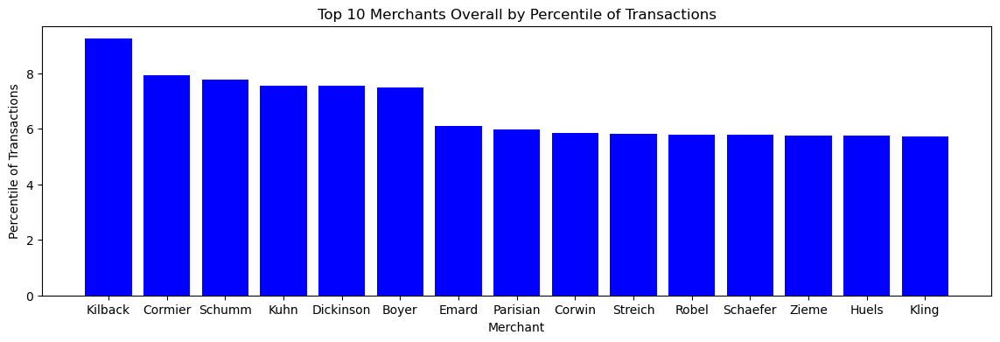

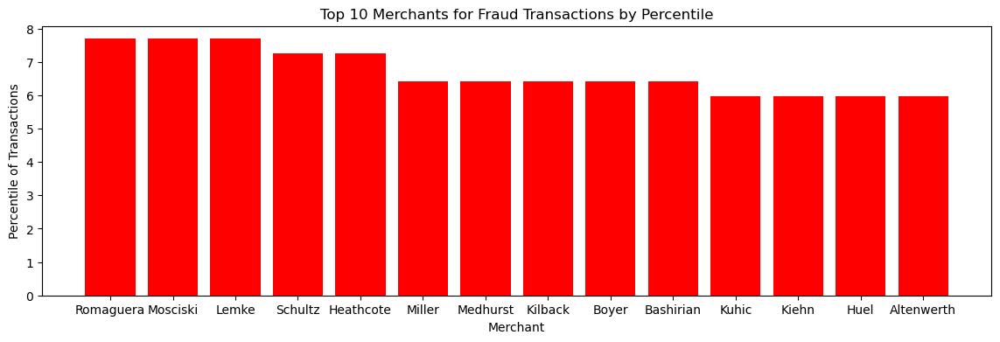

In [14]:
def get_first_word(merchant_name):
    match = re.match(r'^([\w]+)[, \-]', merchant_name)
    if match:
        return match.group(1)
    else:
        return merchant_name

# SQL query for top 10 merchants overall
top_merchants_query = '''
SELECT merchant, COUNT(*) as transaction_count
FROM cleaned_fraud_df
GROUP BY merchant
ORDER BY transaction_count DESC
LIMIT 15
'''
top_merchants_df_sql = ps.sqldf(top_merchants_query, locals())
total_transactions = top_merchants_df_sql['transaction_count'].sum()
top_merchants_df_sql['percentile'] = top_merchants_df_sql['transaction_count'].apply(lambda x: (x / total_transactions) * 100)
top_merchants_df_sql['merchant'] = top_merchants_df_sql['merchant'].apply(get_first_word)

# Plotting top 10 merchants overall
plt.figure(figsize=(14, 4))
plt.bar(top_merchants_df_sql['merchant'], top_merchants_df_sql['percentile'], color='blue')
plt.title('Top 10 Merchants Overall by Percentile of Transactions')
plt.xlabel('Merchant')
plt.ylabel('Percentile of Transactions')
plt.show()

# SQL query for top 10 merchants where isFraud = 1
top_fraud_merchants_query = '''
SELECT merchant, COUNT(*) as transaction_count
FROM cleaned_fraud_df
WHERE is_fraud = 1
GROUP BY merchant
ORDER BY transaction_count DESC
LIMIT 15
'''
top_fraud_merchants_df_sql = ps.sqldf(top_fraud_merchants_query, locals())
total_fraud_transactions = top_fraud_merchants_df_sql['transaction_count'].sum()
top_fraud_merchants_df_sql['percentile'] = top_fraud_merchants_df_sql['transaction_count'].apply(lambda x: (x / total_fraud_transactions) * 100)
top_fraud_merchants_df_sql['merchant'] = top_fraud_merchants_df_sql['merchant'].apply(get_first_word)

# Plotting top 10 merchants for fraud transactions
plt.figure(figsize=(14, 4))
plt.bar(top_fraud_merchants_df_sql['merchant'], top_fraud_merchants_df_sql['percentile'], color='red')
plt.title('Top 10 Merchants for Fraud Transactions by Percentile')
plt.xlabel('Merchant')
plt.ylabel('Percentile of Transactions')
plt.show()


Looking at these results, there isn't much overlap in terms of merchants for fraud vs overall, so we will likely drop this column

We perform a similar analysis on transaction categories.

In [15]:
# Look at the repeating categories
print("There are a total of " + str(cleaned_fraud_df['category'].nunique()) + " categories\nThey are:\n")
unique_categories = cleaned_fraud_df['category'].unique()

for category in sorted(unique_categories):
    print(f"- {category}")

There are a total of 14 categories
They are:

- entertainment
- food_dining
- gas_transport
- grocery_net
- grocery_pos
- health_fitness
- home
- kids_pets
- misc_net
- misc_pos
- personal_care
- shopping_net
- shopping_pos
- travel


And lastly, we assess if there are any recurring cardholder jobs.


In [16]:
print("There are a total of " + str(cleaned_fraud_df['job'].nunique()) + " jobs\nThey are:\n")
unique_jobs = cleaned_fraud_df['job'].unique()

for category in sorted(unique_jobs):
    print(f"- {category}")

There are a total of 478 jobs
They are:

- Academic librarian
- Accountant, chartered certified
- Accountant, chartered public finance
- Accounting technician
- Acupuncturist
- Administrator
- Administrator, arts
- Administrator, charities/voluntary organisations
- Administrator, education
- Administrator, local government
- Advertising account executive
- Advertising account planner
- Advertising copywriter
- Advice worker
- Aeronautical engineer
- Agricultural consultant
- Aid worker
- Air broker
- Air cabin crew
- Airline pilot
- Ambulance person
- Amenity horticulturist
- Analytical chemist
- Animal nutritionist
- Animal technologist
- Animator
- Applications developer
- Arboriculturist
- Archaeologist
- Architect
- Architectural technologist
- Archivist
- Armed forces logistics/support/administrative officer
- Armed forces training and education officer
- Art gallery manager
- Art therapist
- Artist
- Arts development officer
- Associate Professor
- Audiological scientist
- Barist

Looking at this list, we found it valuable to remove the fine-grained jobs titles and instead, create "broad groups" of jobs (i.e. combining "Accountant, chartered certified" and "Accountant, chartered public finance" to "Accountant"). We use Regex to extract the first word of a job title, creating a new column called `job_category` that stores this value.

In [17]:
import re

# Function to extract the first word of a string
def extract_first_word(category):
    return re.split(',|\s+', category.strip())[0]


# Apply the function to create a new column with the first word of each category
cleaned_fraud_df['First Word'] = cleaned_fraud_df['job'].apply(extract_first_word)

# Find unique first words to use as broad categories
broad_categories = cleaned_fraud_df['First Word'].unique()

# Dictionary to map first words to broad categories
category_mapping = {word: word for word in broad_categories}

# Apply the mapping to the DataFrame
cleaned_fraud_df['job_category'] = cleaned_fraud_df['First Word'].map(category_mapping)




This reduced our job numbers from 478 down to 315, but quickly glancing through the data, we can do better. There are still similar sectors that only looking at the first word couldn't get, such as arts vs art vs artist. We hope to implement this functionality in future iterations of this project.


In [18]:
unique_titles = cleaned_fraud_df['job_category'].unique()

# Sort titles by length (shortest first) to prioritize shorter titles when both are substrings
sorted_titles = sorted(unique_titles, key=len)

# Create a mapping of titles to be replaced
replacement_map = {}
for i, title1 in enumerate(sorted_titles):
    for title2 in sorted_titles[i+1:]:
        if title1 in title2:
            replacement_map[title2] = title1
        elif title2 in title1:
            replacement_map[title1] = title2

# Update DataFrame using the replacement map
cleaned_fraud_df['job_category'] = cleaned_fraud_df['job_category'].replace(replacement_map)



In [19]:
print("There are a total of " + str(cleaned_fraud_df['job_category'].nunique()) + " broad jobs categories\nThey are:\n")
unique_jobs = cleaned_fraud_df['job_category'].unique()

for category in sorted(unique_jobs):
    print(f"- {category}")
cleaned_fraud_df.drop(columns = ['First Word', 'job'], inplace = True)


There are a total of 290 broad jobs categories
They are:

- Academic
- Accountant
- Accounting
- Acupuncturist
- Administrator
- Advertising
- Advice
- Aeronautical
- Agricultural
- Aid
- Air
- Ambulance
- Amenity
- Analytical
- Animal
- Animator
- Applications
- Arboriculturist
- Archaeologist
- Architect
- Archivist
- Armed
- Art
- Associate
- Audiological
- Barista
- Barrister
- Biochemist
- Biomedical
- Bookseller
- Broadcast
- Building
- Buyer
- Cabin
- Call
- Camera
- Careers
- Cartographer
- Catering
- Ceramics
- Charity
- Chartered
- Chemical
- Chemist
- Chief
- Child
- Chiropodist
- Civil
- Claims
- Clinical
- Clothing/textile
- Colour
- Commercial
- Commissioning
- Communications
- Community
- Company
- Comptroller
- Conservation
- Conservator
- Contractor
- Control
- Copy
- Corporate
- Counselling
- Counsellor
- Curator
- Cytogeneticist
- Dance
- Data
- Dealer
- Designer
- Development
- Diagnostic
- Dispensing
- Doctor
- Drilling
- Early
- Ecologist
- Economist
- Editor
- Ed

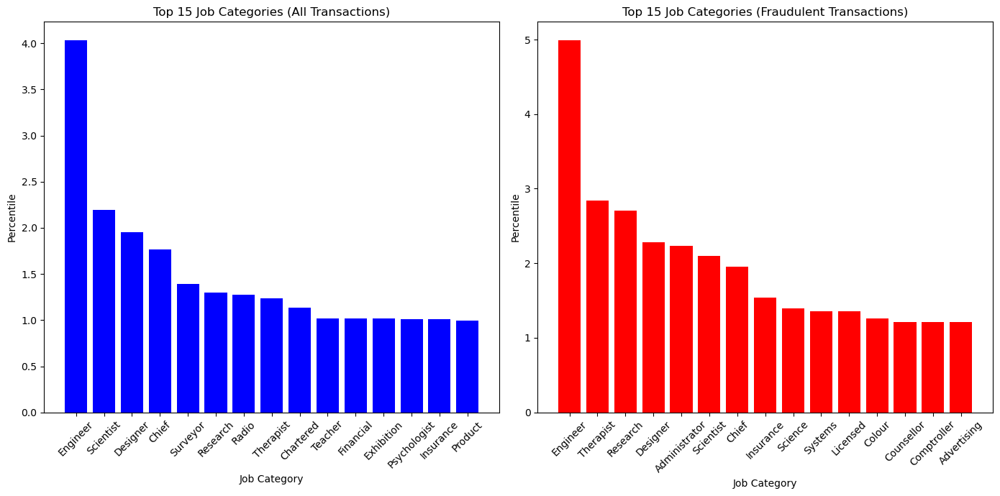

In [20]:
percentiles_all_query = '''
SELECT job_category, COUNT(*) AS count,
       100.0 * COUNT(*) / (SELECT COUNT(*) FROM cleaned_fraud_df) AS percentile
FROM cleaned_fraud_df
GROUP BY job_category
ORDER BY count DESC
LIMIT 15
'''
percentiles_all_df = ps.sqldf(percentiles_all_query, locals())

# SQL query to calculate the percentiles for fraudulent transactions and get the top 15 categories
percentiles_fraud_query = '''
SELECT job_category, COUNT(*) AS count,
       100.0 * COUNT(*) / (SELECT COUNT(*) FROM cleaned_fraud_df WHERE is_fraud = 1) AS percentile
FROM cleaned_fraud_df
WHERE is_fraud = 1
GROUP BY job_category
ORDER BY count DESC
LIMIT 15
'''
percentiles_fraud_df = ps.sqldf(percentiles_fraud_query, locals())

# Plotting the percentile distribution for all transactions
plt.figure(figsize=(14, 7))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
plt.bar(percentiles_all_df['job_category'], percentiles_all_df['percentile'], color='blue')
plt.title('Top 15 Job Categories (All Transactions)')
plt.xlabel('Job Category')
plt.ylabel('Percentile')
plt.xticks(rotation=45)

# Plotting the percentile distribution for fraudulent transactions
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
plt.bar(percentiles_fraud_df['job_category'], percentiles_fraud_df['percentile'], color='red')
plt.title('Top 15 Job Categories (Fraudulent Transactions)')
plt.xlabel('Job Category')
plt.ylabel('Percentile')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

Compared to the merchant category earlier, this one has much more overlap, so it makes much more sense to keep this for further analysis.

## 2.3 Parsing Unix Time


We have a `unix_time` column in our dataset that we can extract information from. First, we convert this into a more human-readable datetime format, storing it in a new column called `datetime`. We extract the month and day of the week (where Monday is represented as 0 and Sunday as 6), creating new columns `month` and `day_of_week`. Additionally, we also classify the time of day, as this might represent useful information. A function `get_time_of_day` is defined to categorize the time of day into four broad segments (Early Morning, Morning, Afternoon, Evening) based on the hour of the day.

This function checks the hour of the timestamp and assigns a corresponding category (0-3).

0: Early Morning (Midnight to 5:59 AM)\
1: Morning (6:00 AM to 11:59 AM)\
2: Afternoon (12:00 PM to 5:59 PM)\
3: Evening (6:00 PM to 11:59 PM)

This information is stored in the column `time_of_day`.

In [21]:

# Convert UNIX time to datetime
cleaned_fraud_df['datetime'] = pd.to_datetime(cleaned_fraud_df['unix_time'], unit='s')

# Extract month and day of week
cleaned_fraud_df['month'] = cleaned_fraud_df['datetime'].dt.month
cleaned_fraud_df['day_of_week'] = cleaned_fraud_df['datetime'].dt.weekday  # Use dt.weekday for numerical representation
def get_time_of_day(dt):
    hour = dt.hour
    if 0 <= hour < 6:
        return 0
    elif 6 <= hour < 12:
        return 1
    elif 12 <= hour < 18:
        return 2
    else:
        return 3

# Apply function to datetime column
cleaned_fraud_df['time_of_day'] = cleaned_fraud_df['datetime'].apply(get_time_of_day)
# Display the DataFrame
cleaned_fraud_df.head()


,merchant,category,amt,gender,city,state,zip,lat,long,city_pop,dob,unix_time,merch_lat,merch_long,is_fraud,full_name,job_category,datetime,month,day_of_week,time_of_day
0,Kirlin and Sons,personal_care,2.86,M,Columbia,SC,29209,33.9659,-80.9355,333497,19/03/1968,1371816865,33.986391,-81.200714,0,Jeff Elliott,Mechanical,2013-06-21 12:14:25,6,4,2
1,Sporer-Keebler,personal_care,29.84,F,Altonah,UT,84002,40.3207,-110.4360,302,17/01/1990,1371816873,39.450498,-109.960431,0,Joanne Williams,Sales,2013-06-21 12:14:33,6,4,2
2,"Swaniawski, Nitzsche and Welch",health_fitness,41.28,F,Bellmore,NY,11710,40.6729,-73.5365,34496,21/10/1970,1371816893,40.495810,-74.196111,0,Ashley Lopez,Librarian,2013-06-21 12:14:53,6,4,2
3,Haley Group,misc_pos,60.05,M,Titusville,FL,32780,28.5697,-80.8191,54767,25/07/1987,1371816915,28.812398,-80.883061,0,Brian Williams,Set,2013-06-21 12:15:15,6,4,2
4,Johnston-Casper,travel,3.19,M,Falmouth,MI,49632,44.2529,-85.0170,1126,06/07/1955,1371816917,44.959148,-85.884734,0,Nathan Massey,Furniture,2013-06-21 12:15:17,6,4,2


## 2.4 Calculating Distance Between Merchant and Cardholder

Because we have a cardholder `lat` and `long` variable, along with a `merch_lat` and `merch_long` variable, we can use the `haversine` function below to calculate the great circle distance between these two coordinates. The great circle distance is the shortest distance between two points on a sphere. We use this measure rather than the pure distance formula to account for the Earth's curvature and potential skewedness. This distance is stored in a new column, `distance_between`. We are interested in this information because fraudulent transactions may be likely to be far from a cardholder's location.

In [22]:
import builtins

def haversine(lon1, lat1, lon2, lat2):
    # Convert decimal degrees to radians
    lon1, lat1, lon2, lat2 = builtins.map(np.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 3956 # Radius of Earth in miles. Use 6371 for kilometers
    return c * r


# Applying the Haversine formula
cleaned_fraud_df['distance_between'] = cleaned_fraud_df.apply(
    lambda row: haversine(
        row['long'],
        row['lat'],
        row['merch_long'],
        row['merch_lat']
    ), axis=1
)


Below, we see the minimum and maximum distance between a merchant and cardholder. There seems to be a large range of distances across transactions.

In [23]:
min_distance = cleaned_fraud_df['distance_between'].min()
max_distance = cleaned_fraud_df['distance_between'].max()

print("Minimum distance:", min_distance, "miles")
print("Maximum distance:", max_distance, "miles")

Minimum distance: 0.07692378070069826 miles
Maximum distance: 93.71361263184242 miles


## 2.5 Creating Age Column from DOB

Age can be useful to use to provide demographic information about a cardholder, so we create the `age` feature from the `dob` column.

In [24]:
cleaned_fraud_df['dob_datetime'] = pd.to_datetime(cleaned_fraud_df['dob'], format='%d/%m/%Y')

# Create a new column 'transaction_datetime' from 'UNIX time'
cleaned_fraud_df['transaction_datetime'] = pd.to_datetime(cleaned_fraud_df['unix_time'], unit='s')

# Calculate age in years at the time of transaction in a new column 'age'
cleaned_fraud_df['age'] = cleaned_fraud_df['transaction_datetime'].dt.year - cleaned_fraud_df['dob_datetime'].dt.year

cleaned_fraud_df['age'] -= (
    (cleaned_fraud_df['transaction_datetime'].dt.month < cleaned_fraud_df['dob_datetime'].dt.month) |
    ((cleaned_fraud_df['transaction_datetime'].dt.month == cleaned_fraud_df['dob_datetime'].dt.month) &
     (cleaned_fraud_df['transaction_datetime'].dt.day < cleaned_fraud_df['dob_datetime'].dt.day))
).astype(int)
cleaned_fraud_df

cleaned_fraud_df = cleaned_fraud_df.drop(columns = ['dob_datetime', 'transaction_datetime', 'dob', 'datetime', 'unix_time'], axis = 1)

## 2.6 Converting States to Regions

We want to reduce the number of states to categorize. Instead of keeping the categorization between all 50 states, and creating 50 new columns when we later approach one-hot encoding, we want to group these states into larger regions. Below, we compare creating "regions" and "divisions" columns as defined by the U.S. Census Bureau.

In [25]:
def map_state_to_region(state):
    northeast = ['CT', 'ME', 'MA', 'NH', 'RI', 'VT', 'NJ', 'NY', 'PA']
    midwest = ['IL', 'IN', 'MI', 'OH', 'WI', 'IA', 'KS', 'MN', 'MO', 'NE', 'ND', 'SD']
    south = ['DE', 'FL', 'GA', 'MD', 'NC', 'SC', 'VA', 'DC', 'WV', 'AL', 'KY', 'MS', 'TN', 'AR', 'LA', 'OK', 'TX']
    west = ['AZ', 'CO', 'ID', 'MT', 'NV', 'NM', 'UT', 'WY', 'AK', 'CA', 'HI', 'OR', 'WA']

    if state in northeast:
        return 'Northeast'
    elif state in midwest:
        return 'Midwest'
    elif state in south:
        return 'South'
    elif state in west:
        return 'West'
    else:
        return 'Unknown'  

# Applying the function to create the new column
cleaned_fraud_df['region'] = cleaned_fraud_df['state'].apply(map_state_to_region)
region_counts = cleaned_fraud_df['region'].value_counts()
print(region_counts)



region
South        211277
Midwest      156993
Northeast    104851
West          82598
Name: count, dtype: int64


In [26]:
def map_state_to_division(state):
    new_england = ['ME', 'NH', 'VT', 'MA', 'RI', 'CT']
    middle_atlantic = ['NY', 'NJ', 'PA']
    east_north_central = ['OH', 'IN', 'IL', 'MI', 'WI']
    west_north_central = ['MO', 'ND', 'SD', 'NE', 'KS', 'MN', 'IA']
    south_atlantic = ['DE', 'MD', 'DC', 'VA', 'WV', 'NC', 'SC', 'GA', 'FL']
    east_south_central = ['KY', 'TN', 'MS', 'AL']
    west_south_central = ['OK', 'TX', 'AR', 'LA']
    mountain = ['ID', 'MT', 'WY', 'NV', 'UT', 'CO', 'AZ', 'NM']
    pacific = ['AK', 'WA', 'OR', 'CA', 'HI']

    if state in new_england:
        return 'New England'
    elif state in middle_atlantic:
        return 'Middle Atlantic'
    elif state in east_north_central:
        return 'East North Central'
    elif state in west_north_central:
        return 'West North Central'
    elif state in south_atlantic:
        return 'South Atlantic'
    elif state in east_south_central:
        return 'East South Central'
    elif state in west_south_central:
        return 'West South Central'
    elif state in mountain:
        return 'Mountain'
    elif state in pacific:
        return 'Pacific'
    else:
        return 'Unknown'  

# Applying the function to create the new 'division' column
cleaned_fraud_df['division'] = cleaned_fraud_df['state'].apply(map_state_to_division)

# Counting how many entries belong to each division
division_counts = cleaned_fraud_df['division'].value_counts()

print(division_counts)


division
South Atlantic        90803
East North Central    83107
Middle Atlantic       80772
West South Central    74244
West North Central    73886
East South Central    46230
Pacific               41995
Mountain              40603
New England           24079
Name: count, dtype: int64


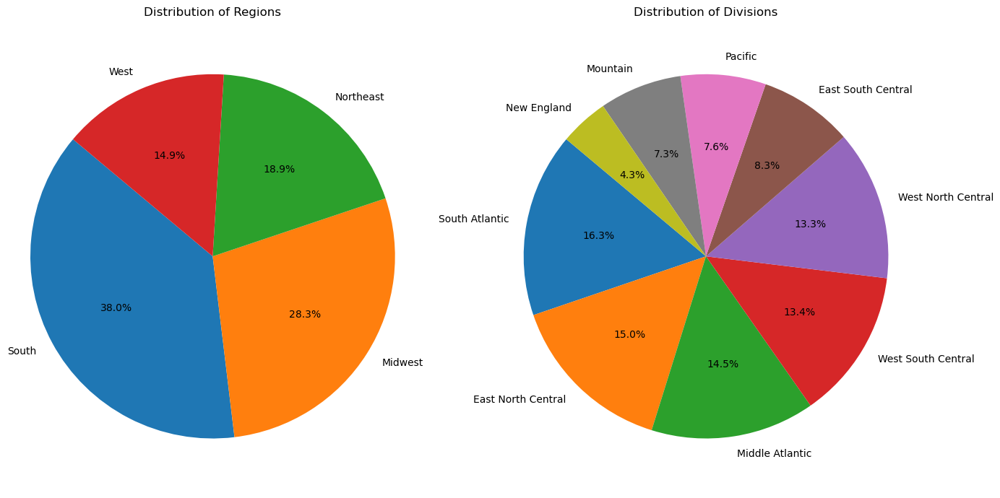

In [27]:

# Creating a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(14, 7))  # 1 row, 2 columns

# Plotting the pie chart for regions
axs[0].pie(region_counts, labels=region_counts.index, autopct='%1.1f%%', startangle=140)
axs[0].set_title('Distribution of Regions')
axs[0].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Plotting the pie chart for divisions
axs[1].pie(division_counts, labels=division_counts.index, autopct='%1.1f%%', startangle=140)
axs[1].set_title('Distribution of Divisions')
axs[1].axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.tight_layout()
plt.show()

Looking at the distributions of region and division, it is clear that using division provides much more information and is less skewed, so we will now drop the other "location" columns, like region, state, city, and zip.

In [28]:
cleaned_fraud_df = cleaned_fraud_df.drop(['region', 'state','zip', 'city'], axis=1)

Below is our final schema after our initial preprocessing and feature engineering.

In [29]:
cleaned_fraud_df.info(verbose=True, max_cols=None)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   merchant          555719 non-null  object 
 1   category          555719 non-null  object 
 2   amt               555719 non-null  float64
 3   gender            555719 non-null  object 
 4   lat               555719 non-null  float64
 5   long              555719 non-null  float64
 6   city_pop          555719 non-null  int64  
 7   merch_lat         555719 non-null  float64
 8   merch_long        555719 non-null  float64
 9   is_fraud          555719 non-null  int64  
 10  full_name         555719 non-null  object 
 11  job_category      555719 non-null  object 
 12  month             555719 non-null  int32  
 13  day_of_week       555719 non-null  int32  
 14  time_of_day       555719 non-null  int64  
 15  distance_between  555719 non-null  float64
 16  age               55

# Part 3: Exploratory Data Analysis


## 3.1 Category Distributions for Fraudulent and Non-Fraudulent Transactions

The below pie charts displays the proportion of non-fraudulent/fraudulent transactions within each category, giving a clear visual comparison of how transaction categories are distributed across fraudulent and non-fraudulent activities.

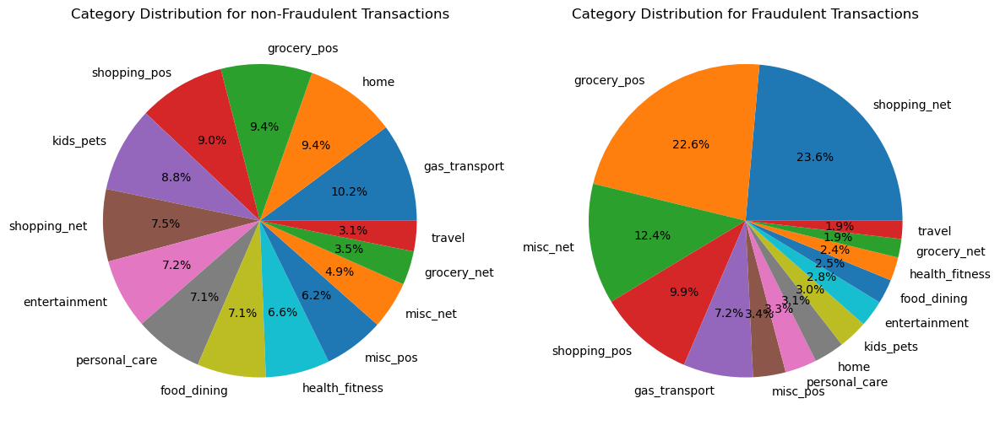

In [30]:

# Count the number of occurrences of each category for isFraud = 0
fraud_0_counts = cleaned_fraud_df[cleaned_fraud_df['is_fraud'] == 0]['category'].value_counts()

# Count the number of occurrences of each category for isFraud = 1
fraud_1_counts = cleaned_fraud_df[cleaned_fraud_df['is_fraud'] == 1]['category'].value_counts()

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot the pie chart for isFraud = 0
ax1.pie(fraud_0_counts, labels=fraud_0_counts.index, autopct='%1.1f%%')
ax1.set_title('Category Distribution for non-Fraudulent Transactions')

# Plot the pie chart for isFraud = 1
ax2.pie(fraud_1_counts, labels=fraud_1_counts.index, autopct='%1.1f%%')
ax2.set_title('Category Distribution for Fraudulent Transactions')

plt.tight_layout()
plt.show()


Since pie charts are not commonly used in industry, we decided to display the same data using a bar chart. This makes it easy to see the categories with the highest fraudulent transactions as well.

/var/folders/yv/6575qc5n29g1m1_6mt59x87w0000gn/T/ipykernel_5721/2115582851.py:13: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(fraud_0_counts.index, rotation=45, ha='right')
/var/folders/yv/6575qc5n29g1m1_6mt59x87w0000gn/T/ipykernel_5721/2115582851.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(fraud_1_counts.index, rotation=45, ha='right')


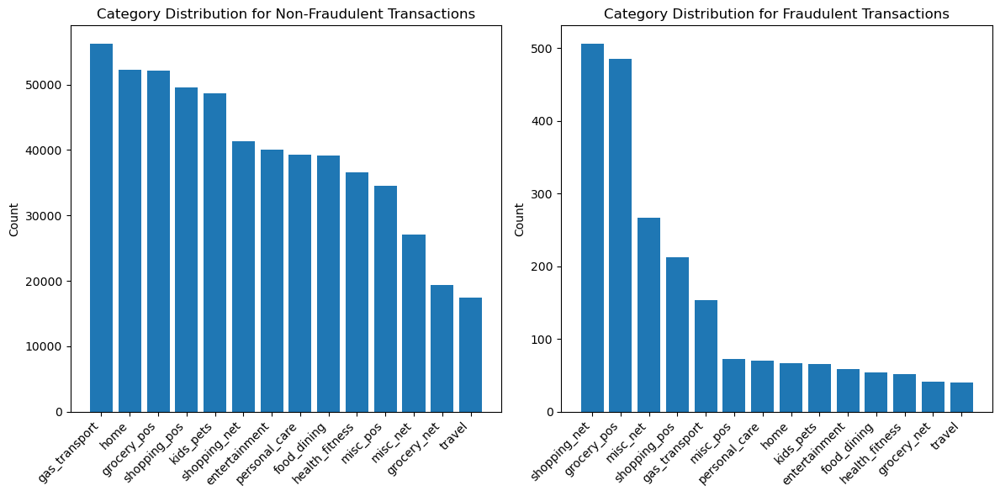

In [31]:

# Count the number of occurrences of each category for isFraud = 0
fraud_0_counts = cleaned_fraud_df[cleaned_fraud_df['is_fraud'] == 0]['category'].value_counts()

# Count the number of occurrences of each category for isFraud = 1
fraud_1_counts = cleaned_fraud_df[cleaned_fraud_df['is_fraud'] == 1]['category'].value_counts()

# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot the bar chart for isFraud = 0
ax1.bar(fraud_0_counts.index, fraud_0_counts.values)
ax1.set_title('Category Distribution for Non-Fraudulent Transactions')
ax1.set_xticklabels(fraud_0_counts.index, rotation=45, ha='right')
ax1.set_ylabel('Count')

# Plot the bar chart for isFraud = 1
ax2.bar(fraud_1_counts.index, fraud_1_counts.values)
ax2.set_title('Category Distribution for Fraudulent Transactions')
ax2.set_xticklabels(fraud_1_counts.index, rotation=45, ha='right')
ax2.set_ylabel('Count')

plt.tight_layout()

plt.show()


Interestingly, online shopping was the category with the greatest number of fraudulent transactions, despite being 6th highest for non-fraudulent transactions. Next, was in person grocery, with almost 500 counts of fraudulent transactions. From this graph, the **class imbalance** is obvious. Our dataset had over 500,000 rows, with only around 2100 fraudulent instances.This was an issue we addressed later on.

## 3.2 Location plot

In [32]:
import folium
from folium.plugins import HeatMap
from IPython.display import IFrame
map_df = cleaned_fraud_df[['lat', 'long']]

latitude = map_df['lat'].mean()
longitude = map_df['long'].mean()
# Create a map centered around an example location
map = folium.Map(location=[latitude, longitude], zoom_start=5)

# Assuming 'map_df' contains columns 'lat' and 'long' for latitude and longitude
heat_data = [[row['lat'], row['long']] for index, row in map_df.iterrows()]

# Add heatmap to the map
HeatMap(heat_data).add_to(map)
map

We see from the above heatmap that our data contains transactions with cardholders residing in all US states, including Alaska and Hawaii. The heatmap tells us that rural and metropolitan areas are represented, with hot spots in certain urban areas like New York City, Detroit, and Los Angeles, to name a few. Overall, we feel that our data is quite representative of all regions of the US.

## 3.3 Correlation Matrix

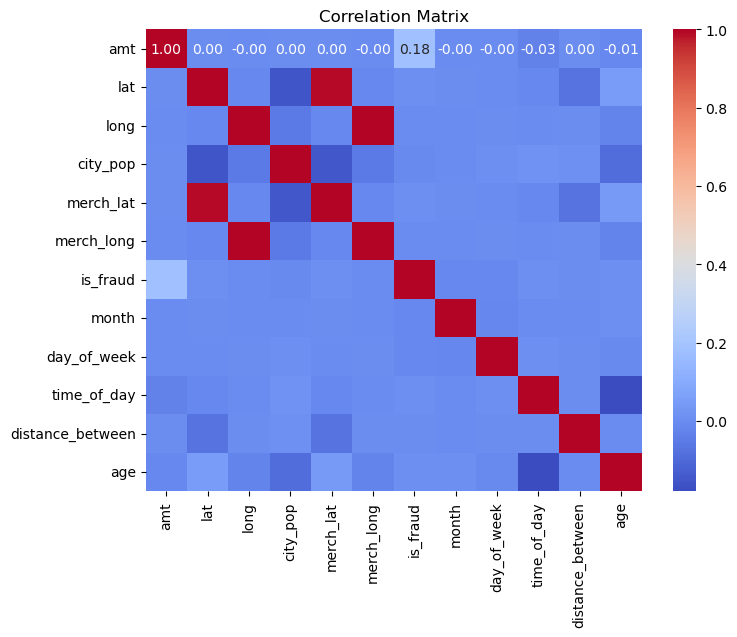

In [33]:
# Calculate correlation matrix
numeric_df = cleaned_fraud_df.select_dtypes(include=['number'])

correlation_matrix = numeric_df.corr()

# Plot correlation matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

From the correlation matrix, we see that `merch_lat` and `lat` are very highly correlated, and `merch_long` and `long` as well. This makes sense, since cardholders are likely to make transactions at vendors near to where they live, and the majority of the transactions in the dataset are non-fraudulent. We decide to drop these columns, as we have computed the `distance_between` metric in section 2.4, so to remove collinearity, we drop these attributes.

In [34]:
cleaned_fraud_df = cleaned_fraud_df.drop(['lat', 'long', 'merch_lat', 'merch_long'], axis = 1)

## 3.4 Price and City Population

We graphed the price distribution with percentile thresholds on a log scale, showing us that we have a skewed data distribution. There are a few very high-value transactions, and a large number of smaller ones.

In [35]:
cleaned_fraud_df['amt'].describe()

count    555719.000000
mean         69.392810
std         156.745941
min           1.000000
25%           9.630000
50%          47.290000
75%          83.010000
max       22768.110000
Name: amt, dtype: float64

In [36]:
percentile_33 = cleaned_fraud_df['amt'].quantile(0.33)
percentile_66 = cleaned_fraud_df['amt'].quantile(0.66)

percentile_90 = cleaned_fraud_df['amt'].quantile(0.90)
percentile_99 = cleaned_fraud_df['amt'].quantile(0.99)


print(f"33rd Percentile: {percentile_33}")
print(f"66th Percentile: {percentile_66}")
print(f"90th Percentile: {percentile_90}")
print(f"99th Percentile: {percentile_99}")

33rd Percentile: 20.34
66th Percentile: 69.39
90th Percentile: 135.55
99th Percentile: 519.8545999999985


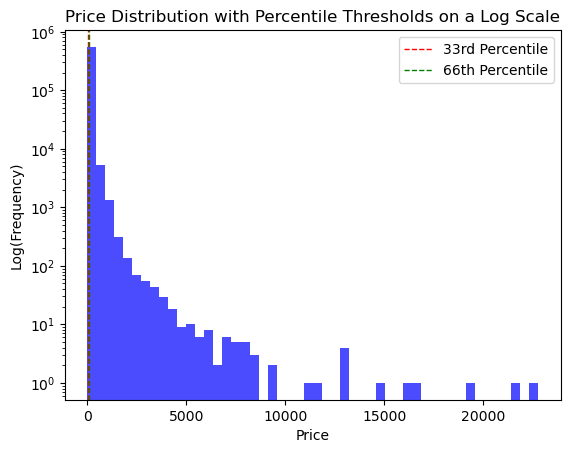

In [37]:
# Plotting the histogram of the 'price' data with logarithmic scale
plt.hist(cleaned_fraud_df['amt'], bins=50, color='blue', alpha=0.7, log=True)
plt.axvline(cleaned_fraud_df['amt'].quantile(0.33), color='red', linestyle='dashed', linewidth=1, label='33rd Percentile')
plt.axvline(cleaned_fraud_df['amt'].quantile(0.66), color='green', linestyle='dashed', linewidth=1, label='66th Percentile')

# Setting the x-axis and y-axis labels
plt.xlabel('Price')
plt.ylabel('Log(Frequency)')

# Adding a title and a legend
plt.title('Price Distribution with Percentile Thresholds on a Log Scale')
plt.legend()


The `amt` values are skewed, with some outliers of extremely high value and a lot of low to medium amount transactions. We use a log scale to display the data in a more interpretable way.

We can see the same applies for the city population feature.

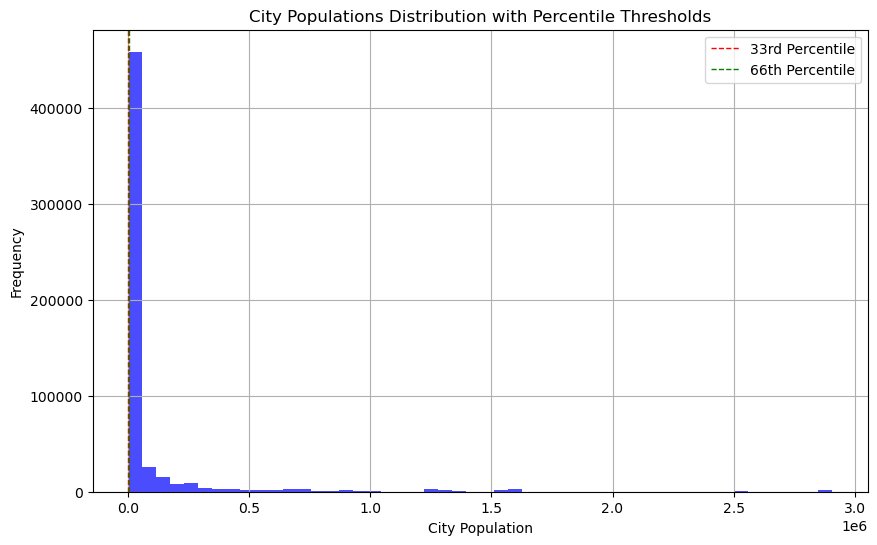

In [38]:
plt.figure(figsize=(10, 6))
plt.hist(cleaned_fraud_df['city_pop'], bins=50, color='blue', alpha=0.7)
plt.axvline(cleaned_fraud_df['city_pop'].quantile(0.33), color='red', linestyle='dashed', linewidth=1, label='33rd Percentile')
plt.axvline(cleaned_fraud_df['city_pop'].quantile(0.66), color='green', linestyle='dashed', linewidth=1, label='66th Percentile')

plt.title('City Populations Distribution with Percentile Thresholds')
plt.xlabel('City Population')
plt.ylabel('Frequency')

plt.legend()

plt.grid(True)
plt.show()

# Part 4: Encoding Categorical Variables, Train Test Split

Gender, currently represented as M and F, is easy to turn into a numerical encoding.

In [39]:
#encode gender, male = 0, female = 1
cleaned_fraud_df['gender'] = cleaned_fraud_df['gender'].apply(lambda x: 0 if x == 'M' else 1)

In [40]:
cleaned_fraud_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 555719 entries, 0 to 555718
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   merchant          555719 non-null  object 
 1   category          555719 non-null  object 
 2   amt               555719 non-null  float64
 3   gender            555719 non-null  int64  
 4   city_pop          555719 non-null  int64  
 5   is_fraud          555719 non-null  int64  
 6   full_name         555719 non-null  object 
 7   job_category      555719 non-null  object 
 8   month             555719 non-null  int32  
 9   day_of_week       555719 non-null  int32  
 10  time_of_day       555719 non-null  int64  
 11  distance_between  555719 non-null  float64
 12  age               555719 non-null  int64  
 13  division          555719 non-null  object 
dtypes: float64(2), int32(2), int64(5), object(5)
memory usage: 55.1+ MB


We had a few features, `category`, `division`, and `job_category` that we wanted to encode. Since these features aren't numerical, we used One Hot Encoding to convert the original feature. In order to avoid column blowup when encoding `job_category`, which has around 300 distinct values, we take the top 20 to encode.

In [41]:

top_20_categories = cleaned_fraud_df['job_category'].value_counts().nlargest(20).index

# Filter the DataFrame to include only the top 20 categories
filtered_df = cleaned_fraud_df[cleaned_fraud_df['job_category'].isin(top_20_categories)]

one_hot_fraud_df_n = pd.get_dummies(filtered_df, columns=['category', 'division', 'job_category'], dtype=int)

one_hot_fraud_df_n.head(5)


,merchant,amt,gender,city_pop,is_fraud,full_name,month,day_of_week,time_of_day,distance_between,age,category_entertainment,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,division_East North Central,division_East South Central,division_Middle Atlantic,division_Mountain,division_New England,division_Pacific,division_South Atlantic,division_West North Central,division_West South Central,job_category_Administrator,job_category_Chartered,job_category_Chief,job_category_Designer,job_category_Engineer,job_category_Exhibition,job_category_Financial,job_category_Health,job_category_Insurance,job_category_Music,job_category_Product,job_category_Psychologist,job_category_Radio,job_category_Research,job_category_Scientist,job_category_Surveyor,job_category_Systems,job_category_Teacher,job_category_Television,job_category_Therapist
6,Romaguera Ltd,133.93,1,1139,0,Kayla Sutton,6,4,2,83.460801,62,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
17,"Lang, Towne and Schuppe",16.60,1,5875,0,Lauren Torres,6,4,2,74.019367,20,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
18,Morissette LLC,80.11,1,10076,0,Ashley Cruz,6,4,2,56.299318,35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
28,"Eichmann, Hayes and Treutel",6.21,1,4993,0,Kathleen Martin,6,4,2,62.132869,64,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
38,Hoppe-Parisian,36.72,0,493806,0,Samuel Johnston,6,4,2,70.573702,32,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


In [42]:
X = one_hot_fraud_df_n.drop(['full_name','merchant','is_fraud'], axis = 1)
X


,amt,gender,city_pop,month,day_of_week,time_of_day,distance_between,age,category_entertainment,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,division_East North Central,division_East South Central,division_Middle Atlantic,division_Mountain,division_New England,division_Pacific,division_South Atlantic,division_West North Central,division_West South Central,job_category_Administrator,job_category_Chartered,job_category_Chief,job_category_Designer,job_category_Engineer,job_category_Exhibition,job_category_Financial,job_category_Health,job_category_Insurance,job_category_Music,job_category_Product,job_category_Psychologist,job_category_Radio,job_category_Research,job_category_Scientist,job_category_Surveyor,job_category_Systems,job_category_Teacher,job_category_Television,job_category_Therapist
6,133.93,1,1139,6,4,2,83.460801,62,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
17,16.60,1,5875,6,4,2,74.019367,20,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
18,80.11,1,10076,6,4,2,56.299318,35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
28,6.21,1,4993,6,4,2,62.132869,64,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
38,36.72,0,493806,6,4,2,70.573702,32,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
555705,123.84,1,502,12,1,3,70.500891,53,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
555708,25.49,1,1523,12,1,3,79.096636,29,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
555709,46.71,1,1725,12,1,3,59.441207,46,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
555711,12.68,0,145,12,1,3,61.563968,74,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


We decide to use the conventional 80/20 train test split for our models.

In [43]:
# Separate features and labels
y = one_hot_fraud_df_n['is_fraud']

# Split into training and test with conventional 80/20 method
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)


X.head()

,amt,gender,city_pop,month,day_of_week,time_of_day,distance_between,age,category_entertainment,category_food_dining,category_gas_transport,category_grocery_net,category_grocery_pos,category_health_fitness,category_home,category_kids_pets,category_misc_net,category_misc_pos,category_personal_care,category_shopping_net,category_shopping_pos,category_travel,division_East North Central,division_East South Central,division_Middle Atlantic,division_Mountain,division_New England,division_Pacific,division_South Atlantic,division_West North Central,division_West South Central,job_category_Administrator,job_category_Chartered,job_category_Chief,job_category_Designer,job_category_Engineer,job_category_Exhibition,job_category_Financial,job_category_Health,job_category_Insurance,job_category_Music,job_category_Product,job_category_Psychologist,job_category_Radio,job_category_Research,job_category_Scientist,job_category_Surveyor,job_category_Systems,job_category_Teacher,job_category_Television,job_category_Therapist
6,133.93,1,1139,6,4,2,83.460801,62,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
17,16.60,1,5875,6,4,2,74.019367,20,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
18,80.11,1,10076,6,4,2,56.299318,35,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
28,6.21,1,4993,6,4,2,62.132869,64,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
38,36.72,0,493806,6,4,2,70.573702,32,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0


# Part 5: Modeling

We are now ready to explore predictive models for our credit card fraud dataset. We begin with a vanilla Logistic Regression, scaling our data per convention.

## 5.1 Logistic Regression

### 5.1.1 Vanilla Model

In [44]:
from sklearn.metrics import make_scorer, roc_auc_score

# Scaling features
scaler = StandardScaler()
X_train_normalized = scaler.fit_transform(X_train)
X_test_normalized = scaler.transform(X_test)

# Fit Logistic Regression model
model = LogisticRegression(max_iter=1000)

# Predict on testing set
model.fit(X_train_normalized, y_train)
y_pred = model.predict(X_test_normalized)
train_predictions = model.predict(X_train_normalized)

# Calculate accuracy
print("Logistic Regression Metrics")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))

print("Train precision:", precision_score(y_train, train_predictions))
print("Train recall:", recall_score(y_train, train_predictions))

Logistic Regression Metrics
Accuracy: 0.9953303759047397
Precision: 0.07142857142857142
Recall: 0.0078125
F1 Score: 0.014084507042253521
Train precision: 0.16666666666666666
Train recall: 0.01556420233463035


We notice how, although our accuracy looks near perfect, recall is near 0! This is largely due to the **class imbalance** in our dataset. We have a large quantity of non-fraudulent transactions, and very small amount of fraudulent transactions. Our performance metrics hint that our model is predicting non-fraudulent for every instance in our testing set. This is reasonable to assume because across all samples, our accuracy is fairly high (as most examples are non-fraudulent to begin with), but out of all the true fraudulent transactions, we are not any of them predicting correctly (low recall), and out of all the predicted positive examples, we reach the conclusion that few of those predictions are accurate (low precision). We decide that our model needs greater complexity, as it seems to be underfitting our data (both training and testing errors, in terms of precision/recall, which are the valuable metrics in our use case, are low!), and also that we must address the class imbalance.

### 5.1.2 SMOTE-ing

We deal with this class imbalance issue by SMOTE-ing our data, i.e. resampling our data such that the fraudulent transactions have a higher weight in our Logistic Regression model. This should ensure that our Logistic Model puts emphasis on these training instances, and therefore hopefully catch them in our test predictions. We also add the `class_weight` parameter to our logistic regression for further balancing.

In [45]:
# Address class imbalance
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_normalized, y_train)

In [46]:
model2 = LogisticRegression(max_iter=1000, class_weight="balanced")
model2.fit(X_train_resampled, y_train_resampled)

# Predict on testing set
y_pred = model2.predict(X_test_normalized)
print("Logistic Regression Metrics")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))


Logistic Regression Metrics
Accuracy: 0.896367699543044
Precision: 0.031456432840515886
Recall: 0.78125
F1 Score: 0.06047777441790142


We notice that after SMOTE-ing our data, we have achieved a much higher recall score! This means that out of all the truly fraudulent cases, we are predicting around 79% as actually fraudulent! Our precision indicates, however, that we are predicting more examples as positive when they aren't. Overall, this was a good first step towards achieving an optimal model.

### 5.1.3 PCA Consideration

Because we had concluded that our model was underfitting, we realized that applying PCA and regularization to our data might not be in our best interest, as these procedures tend to decrease dimesionality and complexity in our data, which could potentially remove important information necessary for our model to learn. We also recognize that in the credit-card detection paradigm, it's crucial for banks to have access to interpretable insights in order to track down fraudulent transactions. As PCA tends to lump features together, this may deteriorate the quality of our data. To confirm these theories, we perform PCA on our original data, then SMOTE our data, to understand whether we have achieved any significant improvement from principal component analysis.

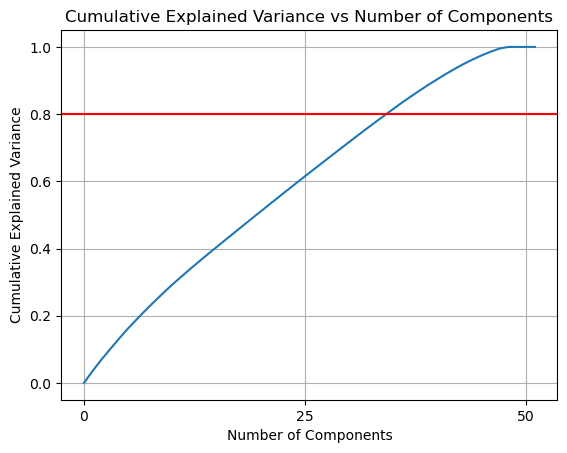

In [47]:
from sklearn.decomposition import PCA

# Fit PCA on the normalized training set
pca = PCA()
X_train_pca = pca.fit(X_train_normalized)
explained_variance_ratios = pca.explained_variance_ratio_
cum_evr = np.cumsum(explained_variance_ratios)

# Plotting the explained variance vs number of components plot
cum_evr = np.insert(cum_evr, 0, 0) # dummy variable so number of components starts at 1
plt.plot(cum_evr)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs Number of Components')
plt.axhline(y = 0.8, color = 'r', linestyle = '-')
plt.xticks(np.arange(0, len(explained_variance_ratios)+1, 25))
plt.grid()
plt.show()

In [48]:
# Fitting and transforming the train and test data set using the updated PCA object with the ideal number of components
pca_final = PCA(n_components = 30)
X_train_pca = pca_final.fit_transform(X_train_normalized)
X_test_pca = pca_final.transform(X_test_normalized)

In [49]:
smote = SMOTE(random_state=42)
X_train2_resampled, y_train2_resampled = smote.fit_resample(X_train_pca, y_train)

model3 = LogisticRegression(max_iter=1000)
model3.fit(X_train2_resampled, y_train2_resampled)

# Predict on testing set
y_pred = model3.predict(X_test_pca)
print("Logistic Regression Metrics")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))


Logistic Regression Metrics
Accuracy: 0.8605783662986558
Precision: 0.022620169651272386
Recall: 0.75
F1 Score: 0.04391582799634035


As we can see, after applying PCA to our data, all of our performance metrics go down. This aligns with our hypothesis that increasing regularization and applying PCA is not in our best interest. `model2` is our best performing model at the momemt.

## 5.2 Decision Tree

We now move onto a Decision Tree classification model. This model has finer grained control on complexity, compared to Logistic Regression, in which we mainly only have control on the regularization/class weight. We recognize that our model could use some increased complexity, and so therefore we can tune the `max_depth` hyperparameter to account for deeper trees, while keeping `class_weight` as balanced and `criterion` as entropy (which results in more balanced trees). We perform a GridSearch to sample a few different depths. We also use a 3-fold cross validation to ensure that our models are performing consistently across the different parameters (i.e. account for some variance in performance). We do want to make sure that we don't jump to the other extreme in this process, and overfit on our data. We are therefore evaluating our models using AUC (area under curve). AUC is advantageous because it is threshold-independent, meaning it evaluates the model's performance across all possible thresholds. It is particularly useful for imbalanced datasets and when the cost of false positives and false negatives are different.

In [50]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold
from sklearn.metrics import make_scorer, roc_auc_score
import numpy as np

# Create a Decision Tree classifier instance
dt_classifier = DecisionTreeClassifier(random_state=42)

param_grid = {
    'max_depth': [2, 5, 10, 20, 30],
    'class_weight': ['balanced'],
    'criterion': ['entropy']
}

# Create binary classification evaluator using accuracy
scorer = make_scorer(roc_auc_score)

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=dt_classifier, param_grid=param_grid, cv=3, scoring=scorer, verbose=2)
grid_search.fit(X_train_normalized, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score (ROC AUC):", best_score)

# Evaluate on test set
test_score = accuracy_score(y_test, grid_search.predict(X_test))
print("Test Set Accuracy:", test_score)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV] END class_weight=balanced, criterion=entropy, max_depth=2; total time=   0.1s
[CV] END class_weight=balanced, criterion=entropy, max_depth=2; total time=   0.1s
[CV] END class_weight=balanced, criterion=entropy, max_depth=2; total time=   0.1s
[CV] END class_weight=balanced, criterion=entropy, max_depth=5; total time=   0.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=5; total time=   0.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=5; total time=   0.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10; total time=   0.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10; total time=   0.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10; total time=   0.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=20; total time=   0.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=20; total time=   0.2s
[CV] END class_weight=

/opt/anaconda3/envs/cis545/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


In [51]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

best_model = grid_search.best_estimator_
test_predictions = best_model.predict(X_test_normalized)
precision = precision_score(y_test, test_predictions)
recall = recall_score(y_test, test_predictions)
accuracy = accuracy_score(y_test, test_predictions)
f1 = f1_score(y_test, test_predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)
print("F1-score:", f1)

Precision: 0.1601796407185629
Recall: 0.8359375
Accuracy: 0.9805877055468464
F1-score: 0.26884422110552764


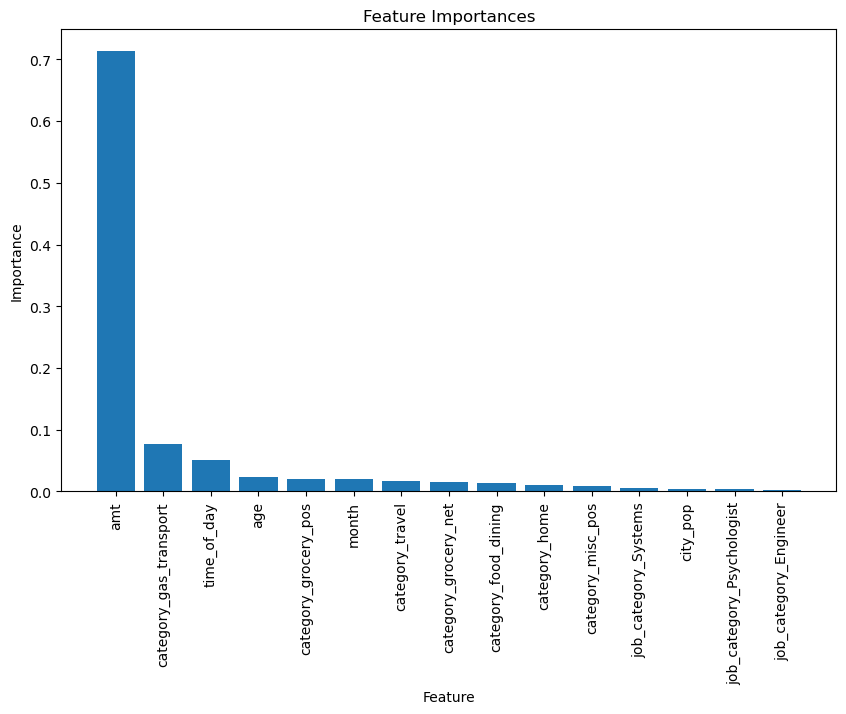

In [52]:
feature_importances = best_model.feature_importances_

feature_names = list(X_train.columns)

sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_feature_names = [feature_names[i] for i in sorted_indices]

plt.figure(figsize=(10, 6))
plt.bar(range(15), sorted_feature_importances[:15], align='center')
plt.xticks(range(15), sorted_feature_names[:15], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()

From these metrics, we notice that our recall has reached 84.3%! This means that on of all the truly fraudulent transactions, most of our predictions report fraudulent! Our precision has increased by a 6x multiplier as well, but still isn't ideal. This low value of 16% means that out of all the fraudulent predictions we make, only 16% of them turn out to be fraudulent. This means we are predicting too many of the non-fraudulent transactions as fraudulent (i.e. false positives). We will try another model to see if we can achieve a higher precision but maintain our other metrics.

## 5.3 Random Forest

Our next step is to try a Random Forest classification model. Random Forest models tend to aggregate decision trees, meaning we can get more complexity in our model. This "emsemble method" can often achieve higher precision by reducing variance and capturing complex patterns in the data, which is our goal following the previous Decision Tree model metrics. We again perform GridSearch on our data, this time tuning the `max_depth` parameter as well as the `n_estimators` parameter, which controls the number of trees we have in our forest (an additional layer of complexity that Decision Trees alone couldn't offer). We maintain the `class_weight` and `criterion` categories.

In [53]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, roc_auc_score

# Create a Random Forest classifier instance
rf_classifier = RandomForestClassifier(random_state=42)

# Define parameter grid for grid search
param_grid = {
    'max_depth': [10, 20, 30],  # Adjust the maximum depth of the trees
    'n_estimators': [15, 25, 35], # Adjust the number of trees in the forest
    'class_weight': ['balanced'],
    'criterion': ['entropy']
}

# Create a binary classification evaluator using ROC AUC
scorer = make_scorer(roc_auc_score)

# Perform grid search
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=2, scoring=scorer, verbose=2)
grid_search.fit(X_train_resampled, y_train_resampled)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters:", best_params)
print("Best Score (ROC AUC):", best_score)

# Evaluate on test set
test_predictions = grid_search.predict(X_test_normalized)
test_roc_auc = roc_auc_score(y_test, test_predictions)
print("Test ROC AUC:", test_roc_auc)

Fitting 2 folds for each of 9 candidates, totalling 18 fits
[CV] END class_weight=balanced, criterion=entropy, max_depth=10, n_estimators=15; total time=   1.3s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10, n_estimators=15; total time=   1.2s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10, n_estimators=25; total time=   2.0s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10, n_estimators=25; total time=   2.0s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10, n_estimators=35; total time=   2.8s
[CV] END class_weight=balanced, criterion=entropy, max_depth=10, n_estimators=35; total time=   2.8s
[CV] END class_weight=balanced, criterion=entropy, max_depth=20, n_estimators=15; total time=   1.7s
[CV] END class_weight=balanced, criterion=entropy, max_depth=20, n_estimators=15; total time=   1.8s
[CV] END class_weight=balanced, criterion=entropy, max_depth=20, n_estimators=25; total time=   2.9s
[CV] END class_weight=balanced,

In [54]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

best_model = grid_search.best_estimator_
test_predictions = best_model.predict(X_test_normalized)
precision = precision_score(y_test, test_predictions)
recall = recall_score(y_test, test_predictions)
accuracy = accuracy_score(y_test, test_predictions)
f1 = f1_score(y_test, test_predictions)

print("Precision:", precision)
print("Recall:", recall)
print("Accuracy:", accuracy)
print("F1-score:", f1)

Precision: 0.9375
Recall: 0.703125
Accuracy: 0.9985324038557754
F1-score: 0.8035714285714286


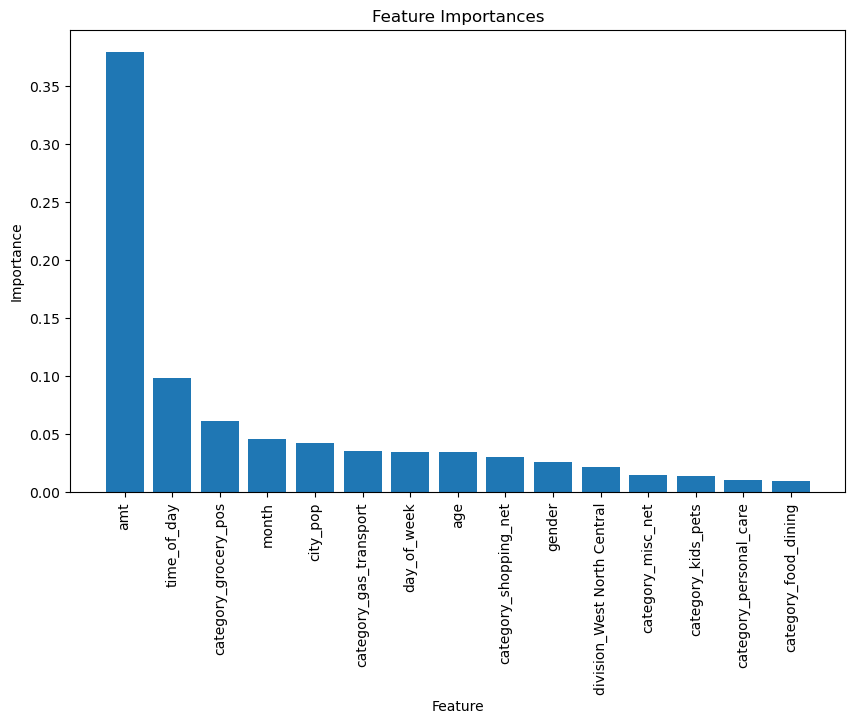

In [55]:

# Get feature importances
feature_importances = best_model.feature_importances_

feature_names = list(X_train.columns)

sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_feature_names = [feature_names[i] for i in sorted_indices]

plt.figure(figsize=(10, 6))
# plt.bar(range(len(feature_importances)), sorted_feature_importances, align='center')
# plt.xticks(range(len(feature_importances)), sorted_feature_names, rotation=90)

plt.bar(range(15), sorted_feature_importances[:15], align='center')
plt.xticks(range(15), sorted_feature_names[:15], rotation=90)

plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()

The random forest model metrics indicate a high precision (95.6%), which means that our model rarely predicts false positives. The recall is also relatively high (69.5%), a big jump from our vanilla logistic regression model (which was near 0), meaning that we have a low rate of false negatives. The feature importance chart indicates that transaction amount, time of day, and the grocery shopping category are the most indicative features. These are reassuring metrics, as we noticed in our EDA that the most prominent category for fraudulent transactions was shopping, so our model is consistent which this observation.

# Part 6: Conclusion

## 6.1 Key Takeaways and Model Implications

From our models, we see that `amt` is by far the most informative in determining whether a transaction is fraudulent, in either complex model. Both Decision Tree and Random Forest Classification models are good options for moving forward, as each have their pros, cons, and tradeoffs. Decision Trees seem to have the highest recall score of 84.3%, but our precision of 16% indicates that we encounter a large degree of false positives. The Decision Tree model also exhibits less of an even distribution in terms of feature importance, with `amt` playing a near 70% influence in our final result. Random Forests have the highest metrics on average, with the highest precision out of all our models, but the third highest recall (still around 0.7 though, so a big improvement from vanilla Logistic Regression). The random forest model also indicates a more even distribution of feature importance, and has more intuitive features in the top 3 influencer positions. Utilizing our model offers superior security measures and fraud prevention capabilities, attracting new customers and gaining a competitive advantage over rivals who may lack similar robust fraud detection mechanisms.

## 6.2 Limitations

For our model, we recognize differing priorities in having high recall over high precision or vice versa. A model with high precision will only flag a transaction as fraudulent if it is very sure, leading to fewer legitimate transactions flagged as fraud. On the other hand, a model with high recall aims to catch as much fraud as possible, even if it means increasing the number of legitimate transactions incorrectly flagged as fraud. This approach ensures that fraudulent activities are less likely to slip through undetected. In terms of real life, banks should veer on the side of recall if they prioritize reducing financial impact and maintaining customer trust, but we acknowledge that high rates of false positives can lead to increased operational costs as each flagged transaction needs to be investigated, and frequently blocking legitimate transactions can frustrate customers. On the other hand, if banks are looking to have a balance of recall & precision, they should look into incorporating our Random Forest classifier, as this ensure there are little false positives (translating to little investigation fees), but not AS adequate fraud prediction (meaning a few instances could slip under their radar). Again, this tradeoff is one with pros and cons, and up to the discretion of the client at play. We personally recommend the Random Forest classifier, as it has higher metrics on average, and seems to have a more insightful handle on what specific features go into a fraudulent prediction!


## 6.3 Future Directions

In the future, we are interested in exploring a wider range of hyperparameters for our random forest classification. Currently, we have only adjusted the max depth and number of estimators, testing only three values each. Moving forward, we plan to test a larger number of values for these parameters and to include additional hyperparameters such as min_samples_split and min_samples_leaf in our assessments, and similarly for Decision Trees.

One issue we dealt with was the number of features resulting from one hot encoding `job_category`. Most of the new features were sparse, and reduced the performance of our models. Since some job categories had very few instances, this high number of features led to increased noise. This issue with using one hot encoding resulted in the decision to just encode the top 20 most common categories.

We would also like to implement consolidating job categories into sectors to reduce column blow up. In our current implementation, we had a very high number of final job categories, despite data processing to reduce the number of categories as much as possible. In the future, we would like to integrate an API to categorize jobs into pre defined sectors, allowing us to reduce the number of jobs to a smaller number of sectors.

Another potential improvement is going further with our feature engineering, generating more complex features, such as repeated transactions (with the same amount and merchant), or any other kind of recurring patterns in the dataset. This could add predictive value to our models.